# About

    The dataset consists of housing data from the Census of India conducted in 2011. It is aggregated at state level. We will explore the data visually by plotting maps to answer some questions.

# References and Resources

* The data has been aggregated and geocoded in this notebook (Is also available at district level aggregation): https://www.kaggle.com/code/virajkadam/geocoding-census-housing-dataset

* Further Work (Housing Price prediction): 1)Adding New features: https://www.kaggle.com/code/virajkadam/geocoding-and-feature-eng-housing-price-dataset 
     2) Joining Census data : https://www.kaggle.com/code/virajkadam/feature-engineering-housing-data-add-census-data

* Paper : Das, Bhaswati & Mistri, Avijit. (2013). Household Quality of Living in Indian States: Analysis of 2011 Census. Environment and Urbanization Asia. 4. 151-171. 10.1177/0975425313477759

# Imports 

In [80]:
#general
import os 
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib as mpl
import numpy as np 

#mapping 
import geopandas as gpd 
import folium 
from shapely import wkt


from sklearn.decomposition import PCA 
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer



import warnings
warnings.filterwarnings('ignore')

**Set Matplotlib settings**

In [81]:
plt.style.use('seaborn-white')

In [82]:
#matplotlib settings   
map_params={'figure.dpi': 150.0,
            'figure.figsize': [13,13],
            "axes.labelcolor": 'k',
#             "axes.spines.bottom": False,
#             "axes.spines.left": False,
#             "axes.spines.right": False,
#             "axes.spines.top": False,
#             "font.size": 0,
#             "xtick.color": "none",
#             "ytick.color": "none",            
            }



mpl.rcParams.update(map_params)

# Loading state data

In [83]:
state_dataset = pd.read_csv('../input/indiacensus-2011-housing-dataset/census_housing_states_dataset.csv')
state_dataset['geometry'] = state_dataset['geometry'].apply(wkt.loads)

#load as a geodataframe
state_dataset = gpd.GeoDataFrame(state_dataset,crs='EPSG:4326')


state_dataset.shape

(35, 138)

# Exploratory data Analysis
    Exploring maps of states , with each of the resource as stated below

# Condition of housing

<h3 style= 'color:green'> What percentages of houses are in good/livable conditions? </h3>

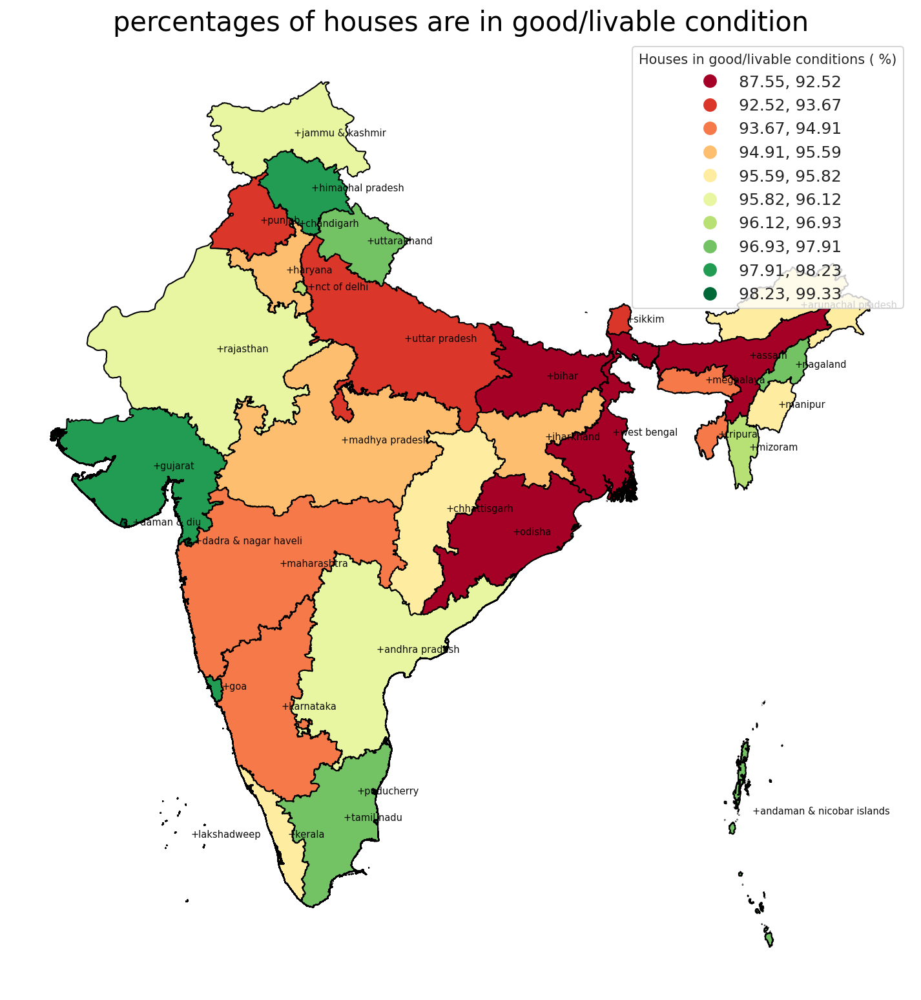

In [84]:
liv_hous = gpd.GeoDataFrame(state_dataset[['Number of households with condition of Census House as: Total (Good)',
                                           'Number of households with condition of Census House as: Total (Livable)']].sum(axis=1),
                                            columns = ['hous_liv'],
                                            geometry = state_dataset['geometry']
                                            )
        
ax=liv_hous.plot(column = 'hous_liv',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',
                         k=10,
                         edgecolor='k',
                         legend_kwds = {'title':"Houses in good/livable conditions ( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('percentages of houses are in good/livable condition',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.95),
                    axis=1)


plt.axis('off')

plt.savefig('hous_liv.png')
plt.show()

<h3 style= 'color:green'> What percentages of houses have a permanent structure?</h3>

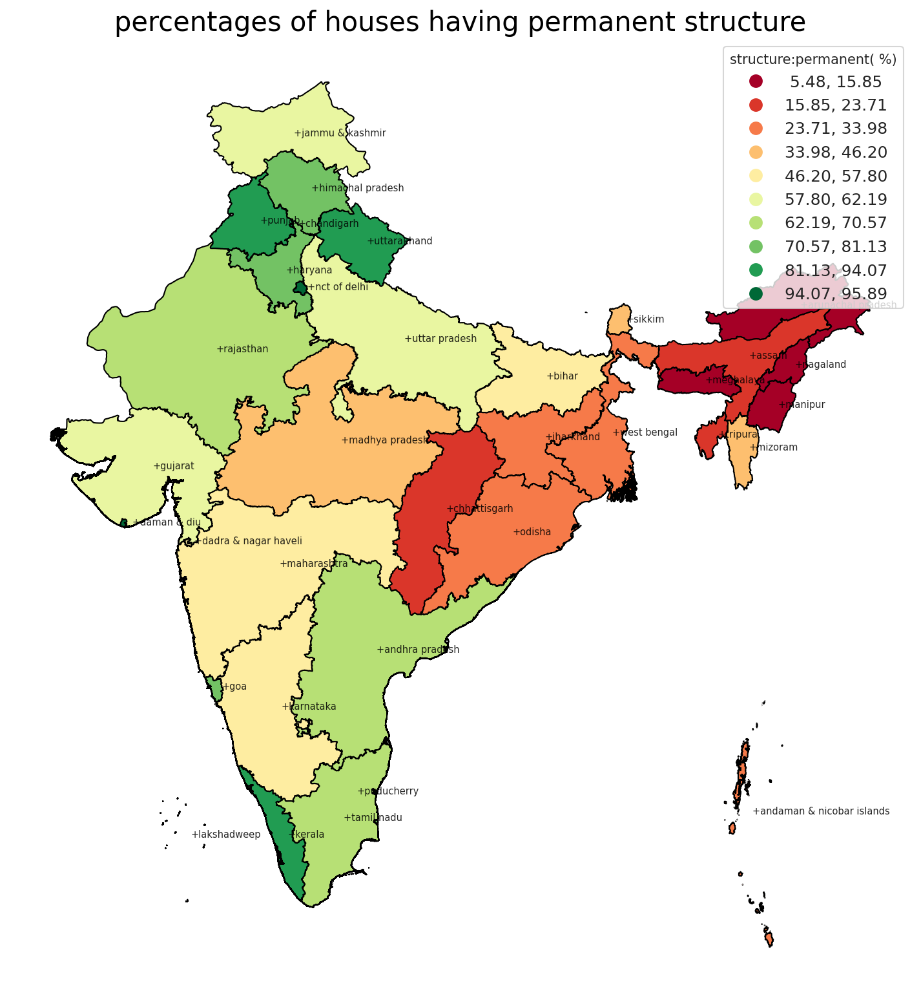

In [85]:
    
     
ax=state_dataset.plot(column = 'Households by Type of Structure of Census Houses: Permanent',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',
                         k=10,
                         edgecolor='k',
                         legend_kwds = {'title':"structure:permanent( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('percentages of houses having permanent structure',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('perm_hous.png')
plt.show()

<h3 style= 'color:green'> What percentages of houses have a Ownership status: Owned?</h3>

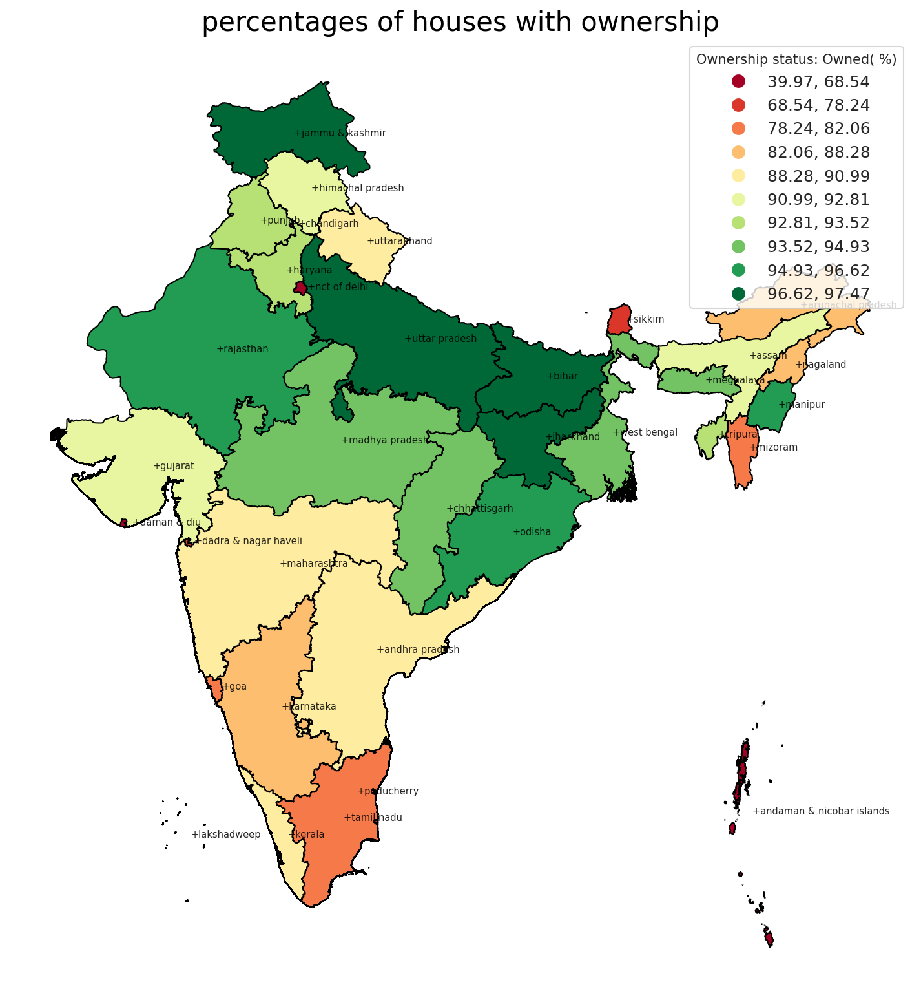

In [86]:
     
ax=state_dataset.plot(column = 'Ownership status: Owned',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',
                         k=10,
                         edgecolor='k',
                         legend_kwds = {'title':"Ownership status: Owned( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('percentages of houses with ownership',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('hous_owned.png')
plt.show()

<h3 style= 'color:green'> What percentages of houses have primary roof materials ? </h3>

    including these in this category: Grass/Thatch/Bamboo/Wood/Mud, Plastic/Polythene, G.I./Metal/Asbestos sheets

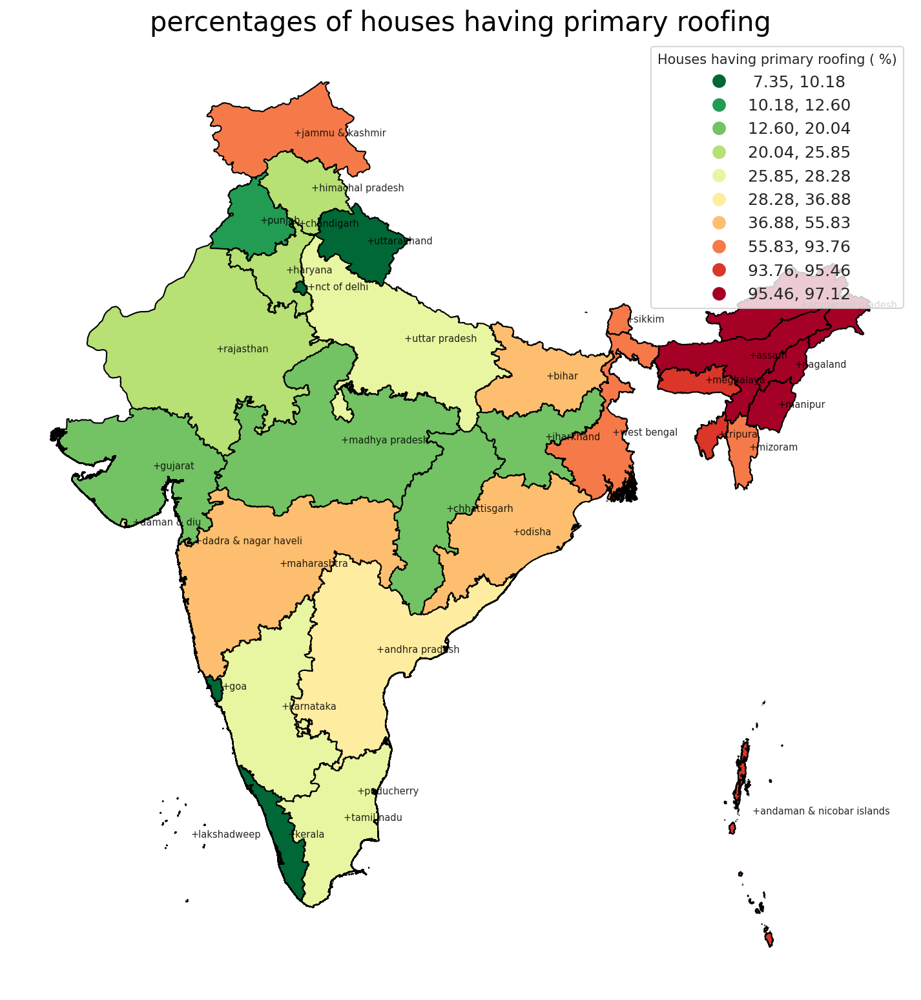

In [87]:
liv_hous = gpd.GeoDataFrame(state_dataset[['Material of Roof: Grass/Thatch/Bamboo/Wood/Mud etc.',
                                           'Material of Roof: Plastic/Polythene',
                                           'Material of Roof: G.I./Metal/Asbestos sheets']].sum(axis=1),
                                            columns = ['roof_ip'],
                                            geometry = state_dataset['geometry']
                                            )
        
ax=liv_hous.plot(column = 'roof_ip',
                         legend=True,
                         cmap ='RdYlGn_r',
                         categorical=True,
                         scheme='QUANTILES',
                         k=10,
                         edgecolor='k',
                         legend_kwds = {'title':"Houses having primary roofing ( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('percentages of houses having primary roofing',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('roof_ip.png')
plt.show()

<h3 style= 'color:green'> What percentages of houses have primary wall materials ? </h3>

    including these in this category: Grass/Thatch/Bamboo/Wood/Mud, Plastic/Polythene, G.I./Metal/Asbestos sheets

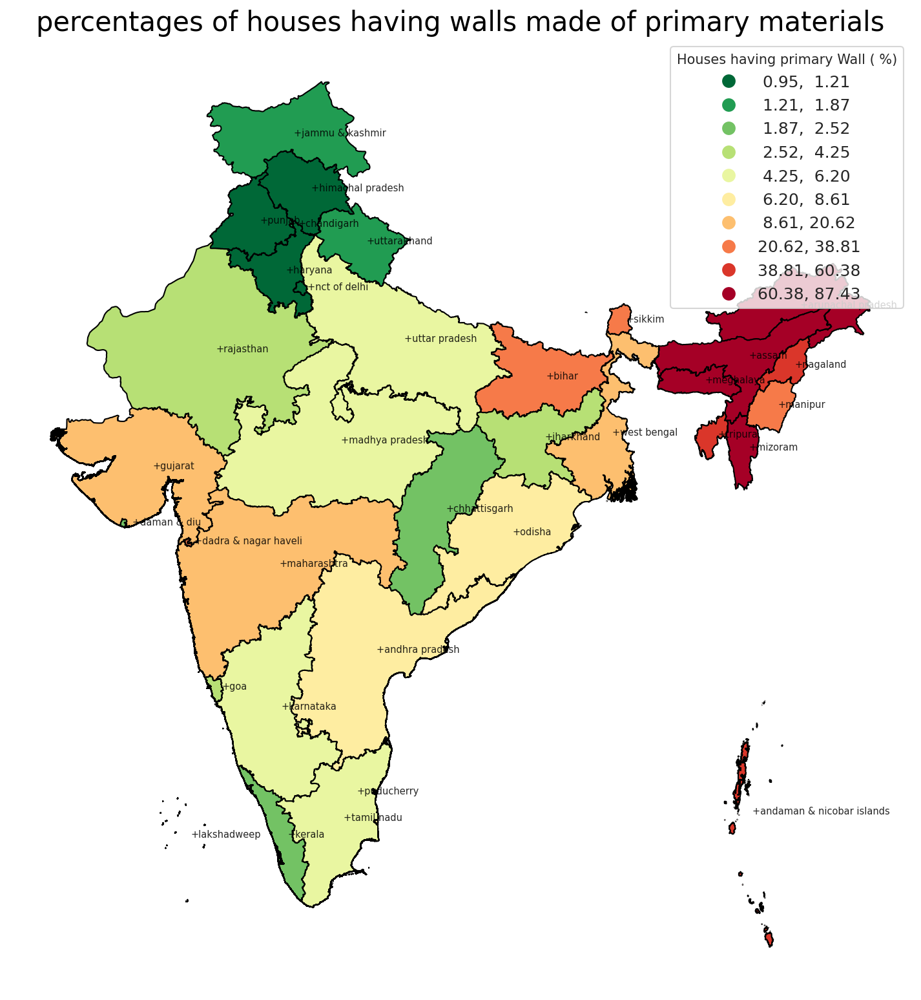

In [88]:
liv_hous = gpd.GeoDataFrame(state_dataset[['Material of Wall: Grass/Thatch/Bamboo etc.',
                                           'Material of Wall: Plastic/Polythene',
                                           'Material of Wall: G.I./Metal/Asbestos sheets']].sum(axis=1),
                                            columns = ['Wall'],
                                            geometry = state_dataset['geometry']
                                            )
        
ax=liv_hous.plot(column = 'Wall',
                         legend=True,
                         cmap ='RdYlGn_r',
                         categorical=True,
                         scheme='QUANTILES',
                         k=10,
                         edgecolor='k',
                         legend_kwds = {'title':"Houses having primary Wall ( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('percentages of houses having walls made of primary materials',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('Wall_ip.png')
plt.show()

<h3 style= 'color:green'> What percentages of houses have three or more rooms? </h3>


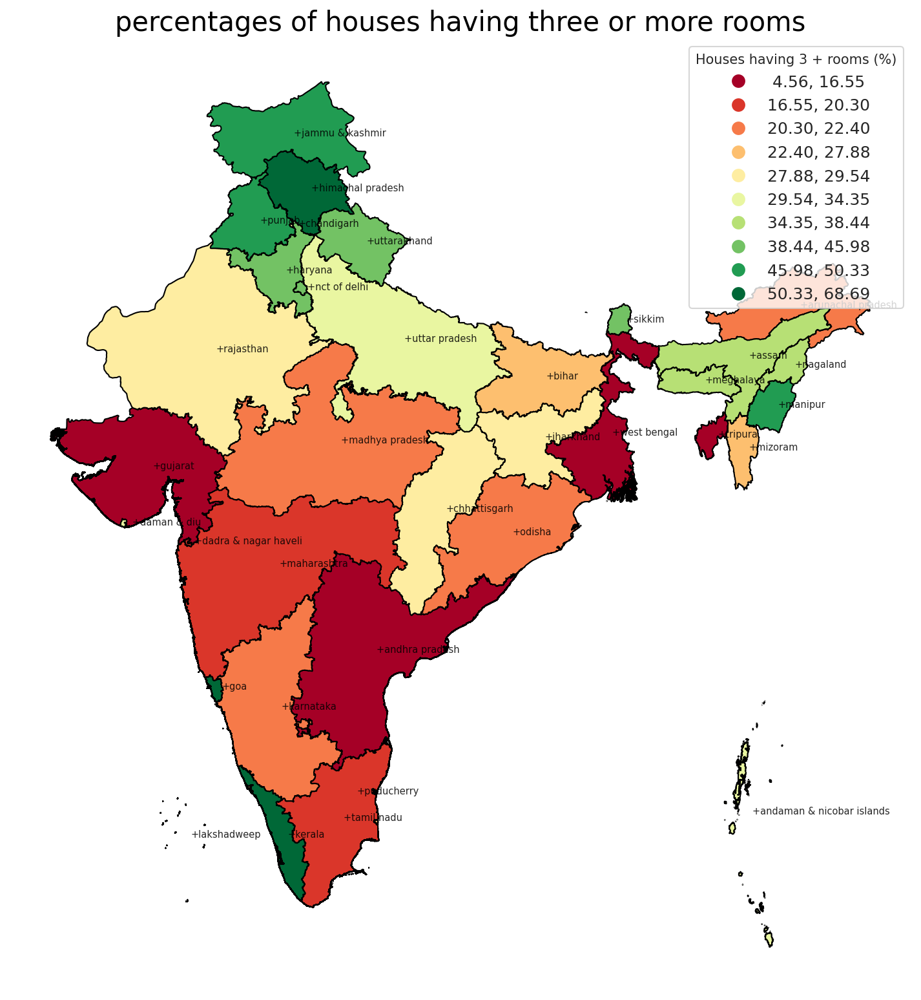

In [89]:
liv_hous = gpd.GeoDataFrame(state_dataset[['Number of Dwelling Rooms: Three rooms',
                                           'Number of Dwelling Rooms: Four rooms',
                                           'Number of Dwelling Rooms: Five rooms','Number of Dwelling Rooms: Six rooms and above']].sum(axis=1),
                                            columns = ['3_rm'],
                                            geometry = state_dataset['geometry']
                                            )
        
ax=liv_hous.plot(column = '3_rm',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',
                         k=10,
                         edgecolor='k',
                         legend_kwds = {'title':"Houses having 3 + rooms (%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('percentages of houses having three or more rooms',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('rooms_3+.png')
plt.show()

<h3 style= 'color:green'> What percentages of houses having 6 or more residents? </h3>


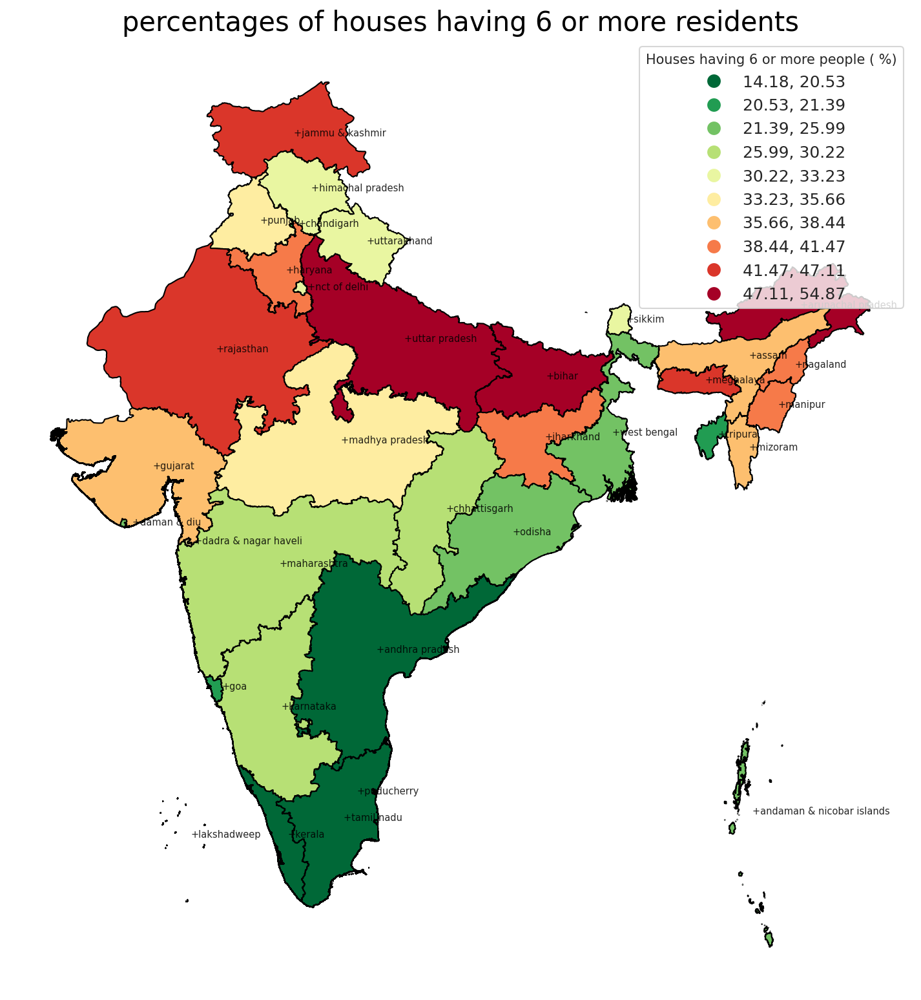

In [90]:
liv_hous = gpd.GeoDataFrame(state_dataset[['Household size: 6-8','Household size: 9+']].sum(axis=1),
                                            columns = ['ppl'],
                                            geometry = state_dataset['geometry']
                                            )
        
ax=liv_hous.plot(column = 'ppl',
                         legend=True,
                         cmap ='RdYlGn_r',
                         categorical=True,
                         scheme='QUANTILES',
                         k=10,
                         edgecolor='k',
                         legend_kwds = {'title':"Houses having 6 or more people ( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('percentages of houses having 6 or more residents',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('6_ppl+.png')
plt.show()

# Energy

<h3 style= 'color:green'> Which states have electriciy as main source of light? </h3>

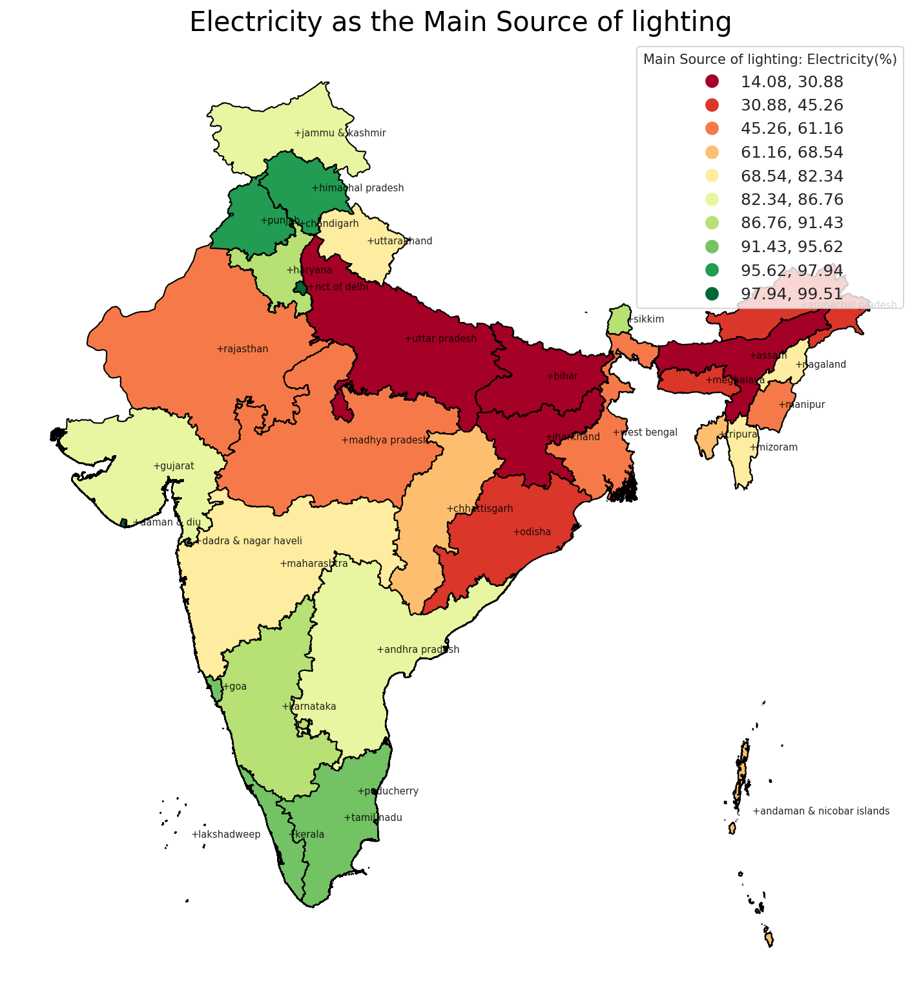

In [91]:
ax=state_dataset.plot(column = 'Main Source of lighting: Electricity',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Main Source of lighting: Electricity(%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Electricity as the Main Source of lighting',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('Elect_lightn.png')
plt.show()

<h3 style= 'color:green'> Where is there no availablity of lighting? </h3>

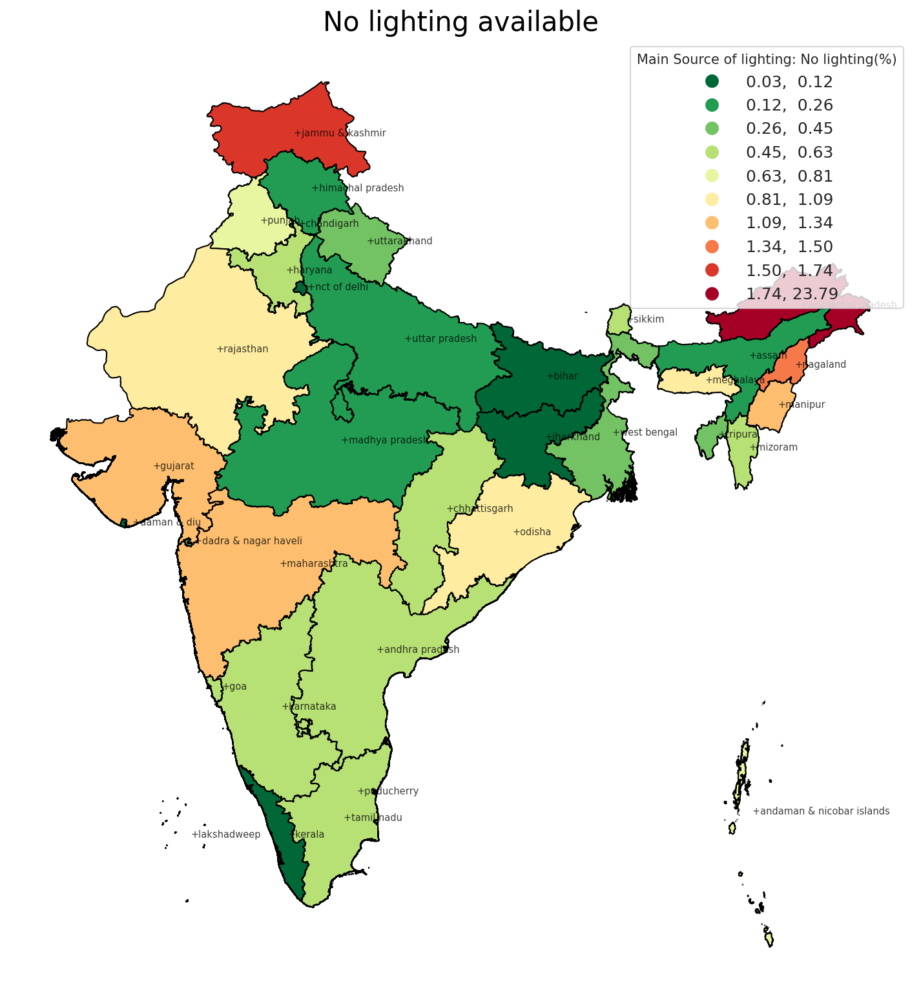

In [92]:

ax=state_dataset.plot(column = 'Main Source of lighting: No lighting',
                     legend=True,
                     cmap ='RdYlGn_r',
                     categorical=True,edgecolor='k',
                     scheme='naturalbreaks',
                     k=10,
                     legend_kwds = {'title':"Main Source of lighting: No lighting(%)",
                                    'loc':'upper right',
                                    'fontsize':'large','frameon':True}
                    )

ax.set_title('No lighting available',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.75),
                    axis=1)


plt.axis('off')

plt.savefig('no_lightn.png')
plt.show()

<h3 style= 'color:green'> Which states have solar energy as main source of light? </h3>

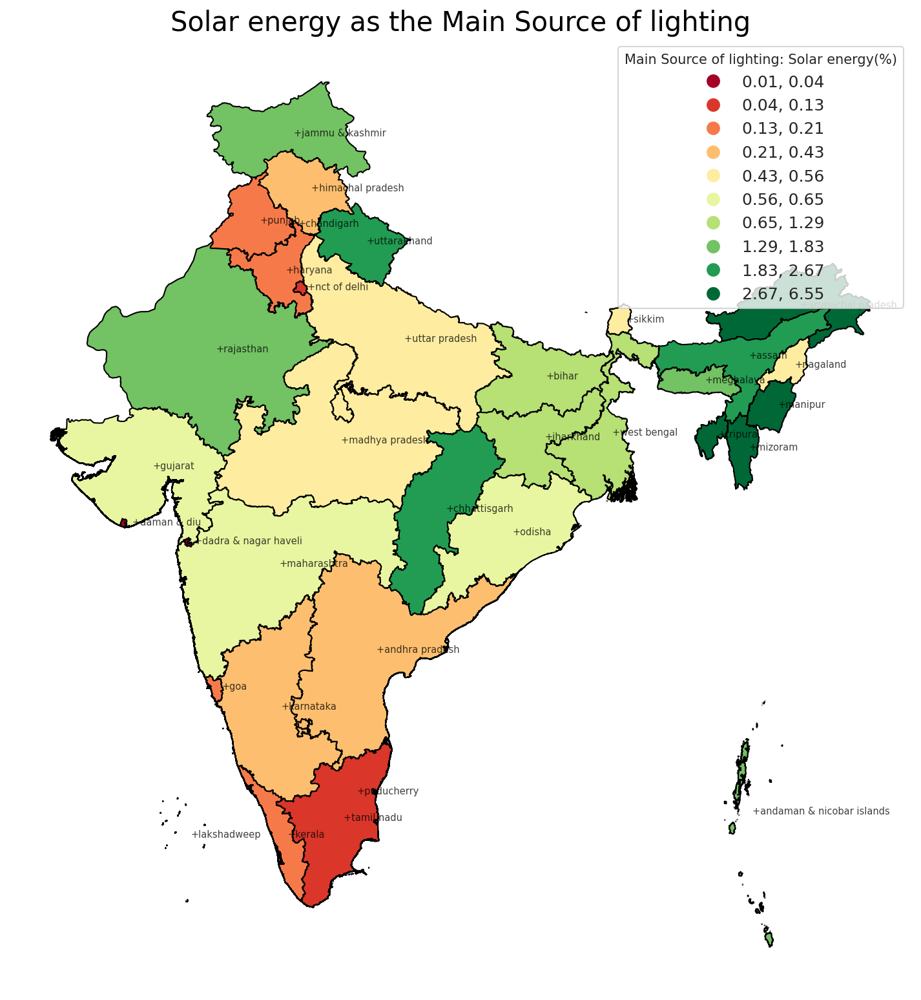

In [93]:
ax=state_dataset.plot(column = 'Main Source of lighting: Solar energy',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,edgecolor='k',
                         scheme='QUANTILES',
                         k=10,
                         legend_kwds = {'title':"Main Source of lighting: Solar energy(%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Solar energy as the Main Source of lighting',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.75),
                    axis=1)


plt.axis('off')

plt.savefig('solar_lightn.png')
plt.show()

# Water

<h3 style= 'color:green'>Tapped Drinking Water is available (treated/untreated)? </h3>

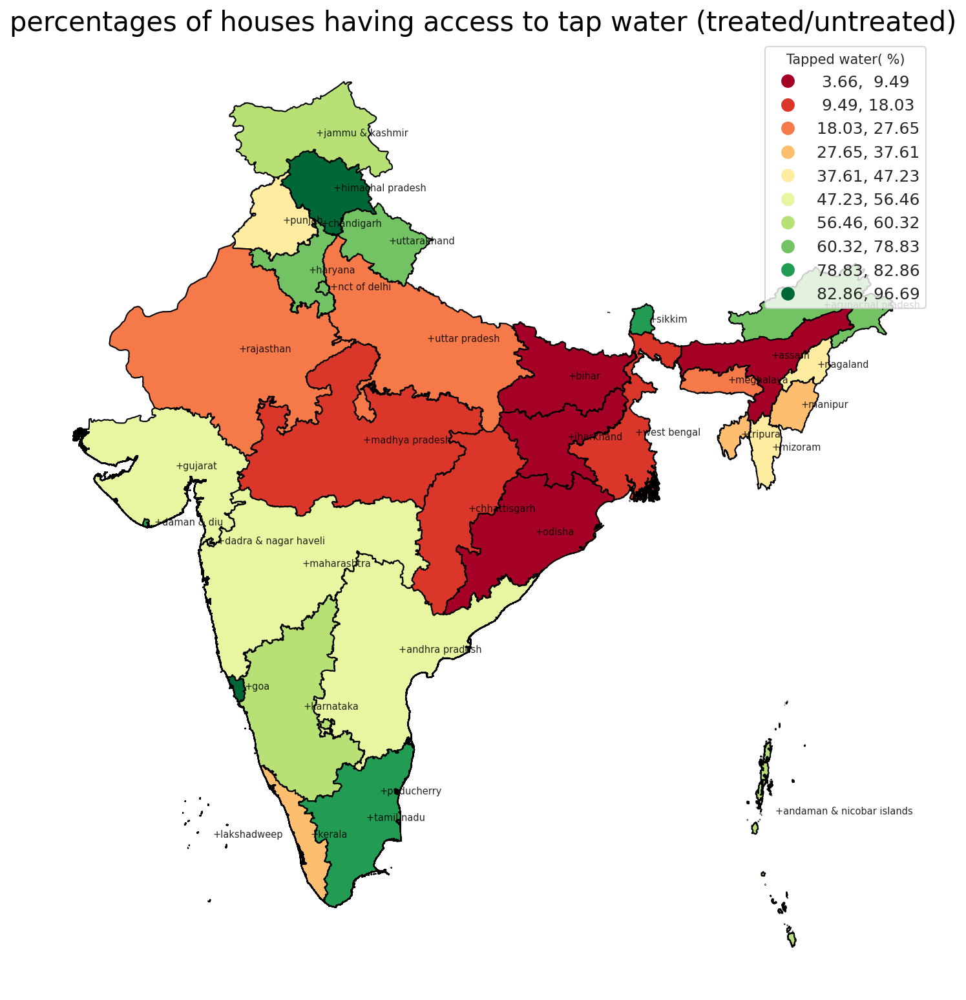

In [94]:
wt = gpd.GeoDataFrame(state_dataset[['Main Source of Drinking Water: Tapwater from treated source',
                                           'Main Source of Drinking Water: Tapwater from un-treated source']].sum(axis=1),
                                            columns = ['tapped'],
                                            geometry = state_dataset['geometry']
                                            )
        
ax=wt.plot(column = 'tapped',
                     legend=True,
                     cmap ='RdYlGn',
                     categorical=True,
                     scheme='QUANTILES',
                     k=10,
                     edgecolor='k',
                     legend_kwds = {'title':"Tapped water( %)",
                                    'loc':'upper right',
                                    'fontsize':'large','frameon':True}
                    )

ax.set_title('percentages of houses having access to tap water (treated/untreated)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('tap_wt.png')
plt.show()

<h3 style= 'color:green'> Drinking Water is available within or near premises ? </h3>

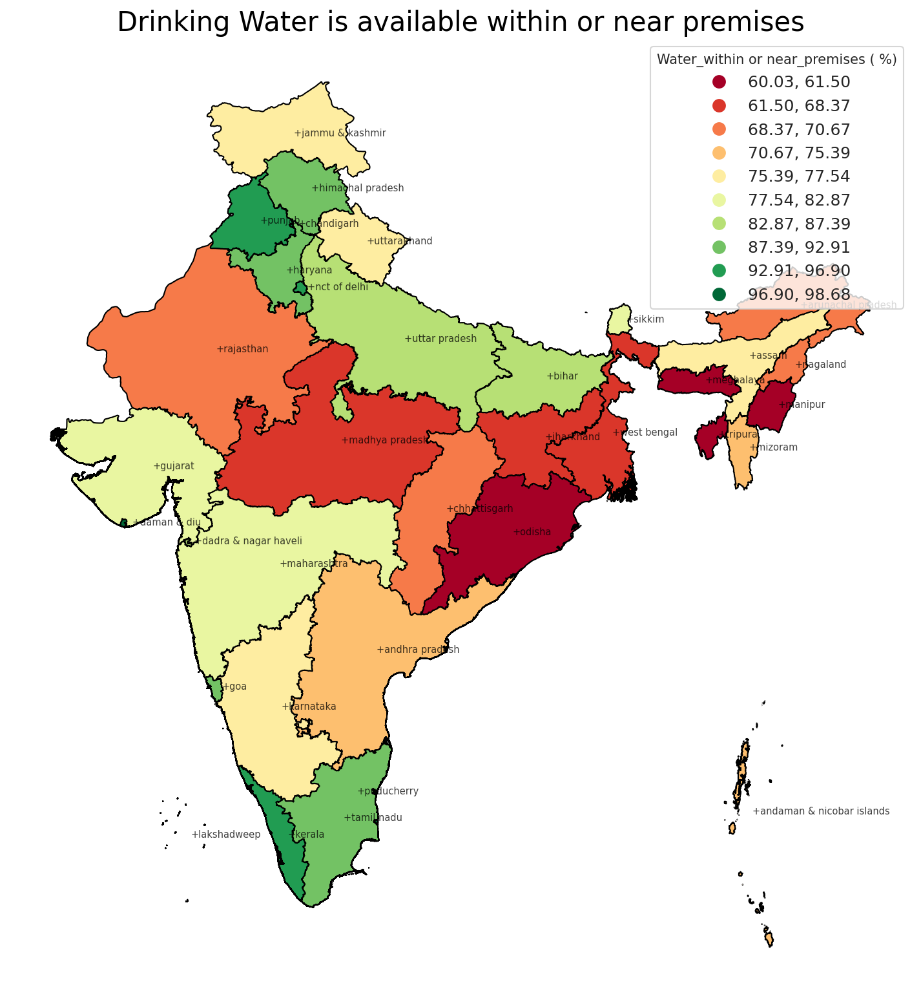

In [95]:
loc_drinking_water_near = gpd.GeoDataFrame(state_dataset[['Location of drinking water source: Within premises',
                                                          'Location of drinking water source: Near premises']].sum(axis=1),
                                            columns = ['Water_within/near_premises'],
                                            geometry = state_dataset['geometry']
                                            )
        
ax=loc_drinking_water_near.plot(column = 'Water_within/near_premises',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Water_within or near_premises ( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Drinking Water is available within or near premises',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.75),
                    axis=1)


plt.axis('off')

plt.savefig('water_np.png')
plt.show()

# Access to Hygiene

<h3 style= 'color:green'> How is the % of households having latrine facility within the premises? </h3>

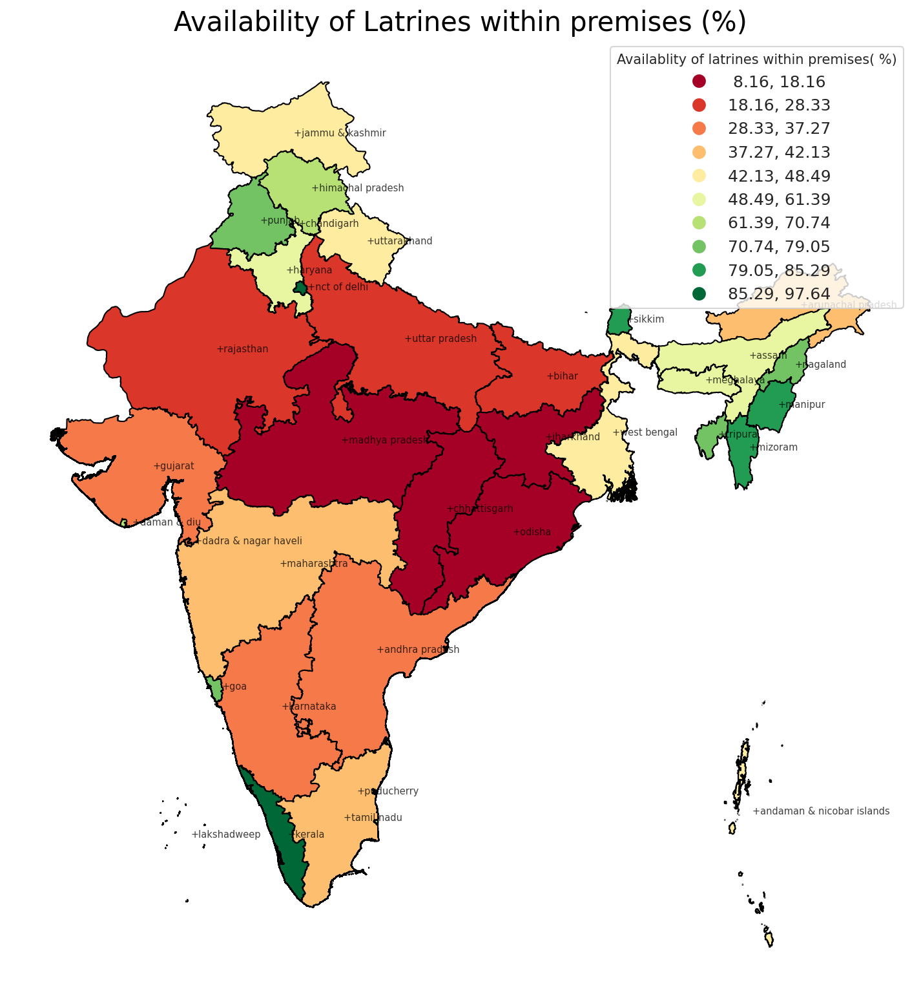

In [96]:
ax=state_dataset.plot(column = 'Number of households having latrine facility within the premises',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Availablity of latrines within premises( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Availability of Latrines within premises (%)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.75),
                    axis=1)


plt.axis('off')

plt.savefig('latrn_w_prems.png')
plt.show()

<h3 style= 'color:green'> How is the % of households having to openly defecate? </h3>

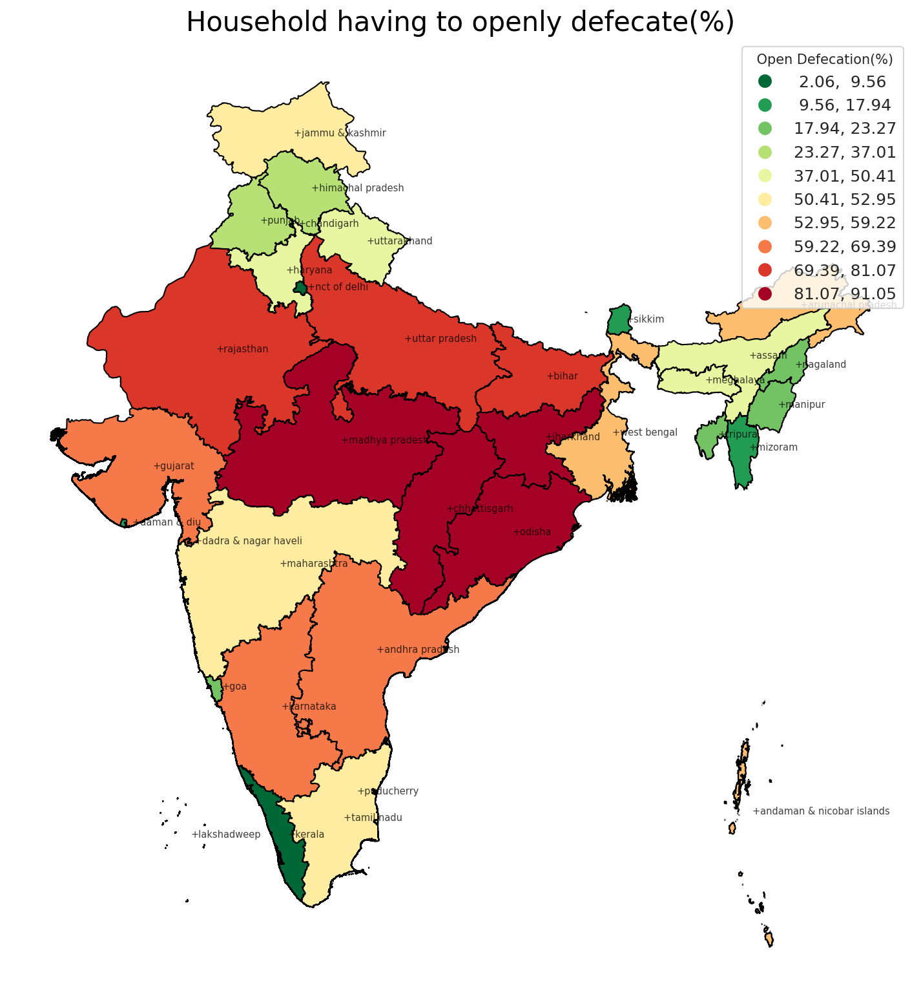

In [97]:

ax=state_dataset.plot(column = 'Alternative source: Open',
                         legend=True,
                         cmap ='RdYlGn_r',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':" Open Defecation(%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Household having to openly defecate(%)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.75),
                    axis=1)


plt.axis('off')

plt.savefig('latrn_open.png')
plt.show()

<h3 style= 'color:green'> How are wastewater drainage facilities available? </h3>

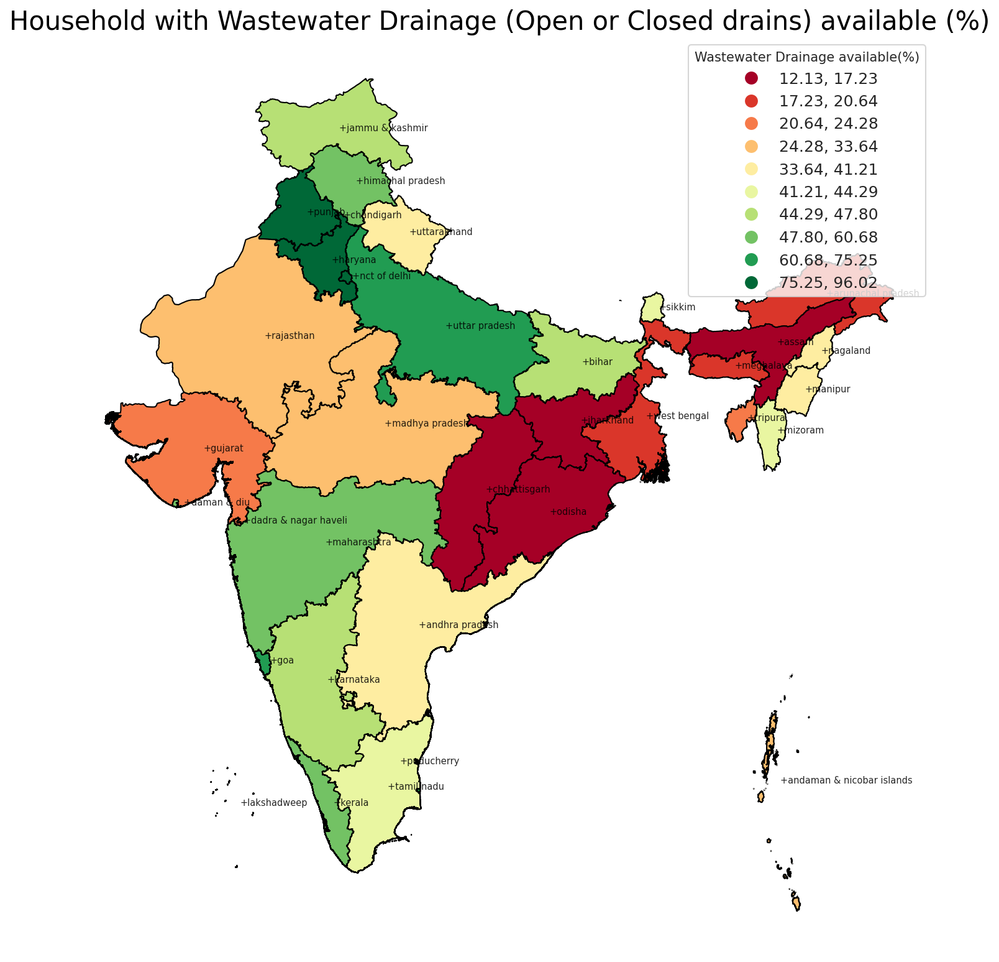

In [98]:
    
drains = gpd.GeoDataFrame(state_dataset[['Waste water outlet connected to: Closed drainage',
                                          'Waste water outlet connected to: Open drainage']].sum(axis=1),
                                            columns = ['drains'],
                                            geometry = state_dataset['geometry']
                                            )

ax=drains.plot(column = 'drains',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Wastewater Drainage available(%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Household with Wastewater Drainage (Open or Closed drains) available (%)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('draing.png')
plt.show()

# Availing Banking services

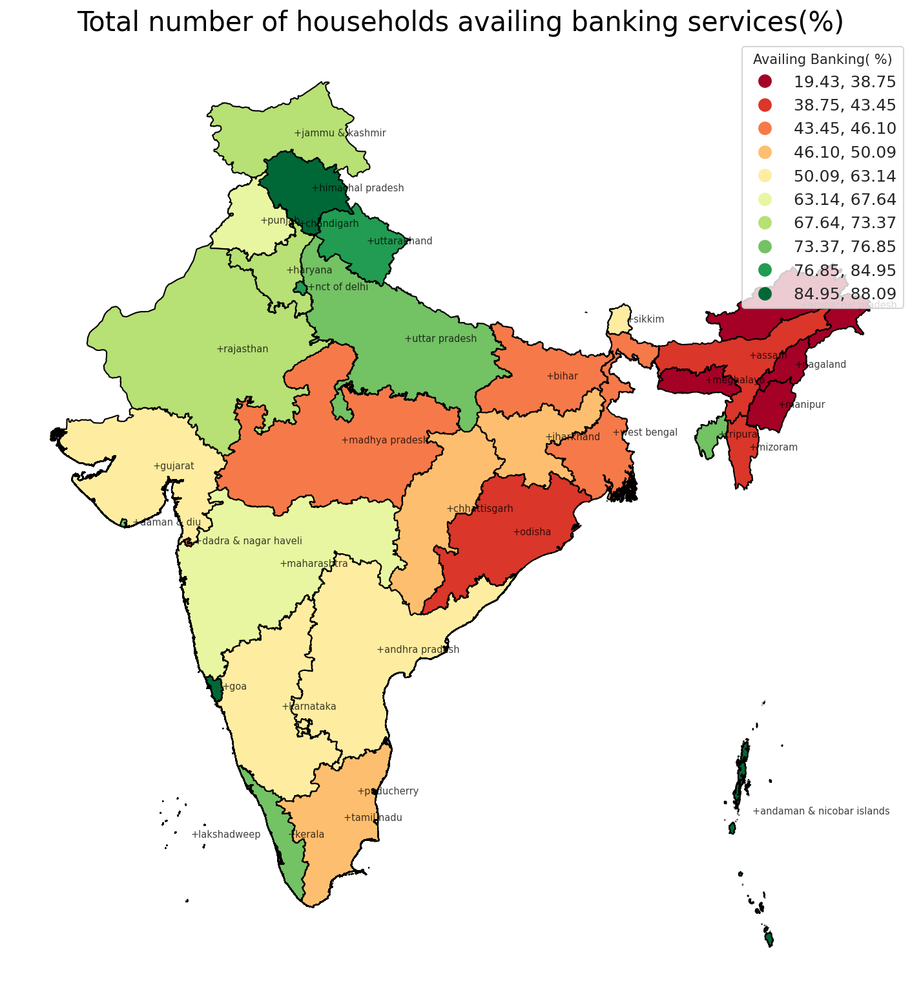

In [99]:

ax=state_dataset.plot(column = 'Total number of households availing banking services',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Availing Banking( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Total number of households availing banking services(%)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.75),
                    axis=1)


plt.axis('off')

plt.savefig('banking.png')
plt.show()

# Fuels used for cooking

<h3 style= 'color:green'> Which states have usage of primary fuels for cooking?? </h3>

    Includes : Fire-wood,Crop residue,Cowdung cake,Coal/Lignite/Charcoal

In [100]:
pf = ['Type of Fuel used for Cooking: Fire-wood',
     'Type of Fuel used for Cooking: Crop residue',
     'Type of Fuel used for Cooking: Cowdung cake',
     'Type of Fuel used for Cooking: Coal/Lignite/Charcoal']

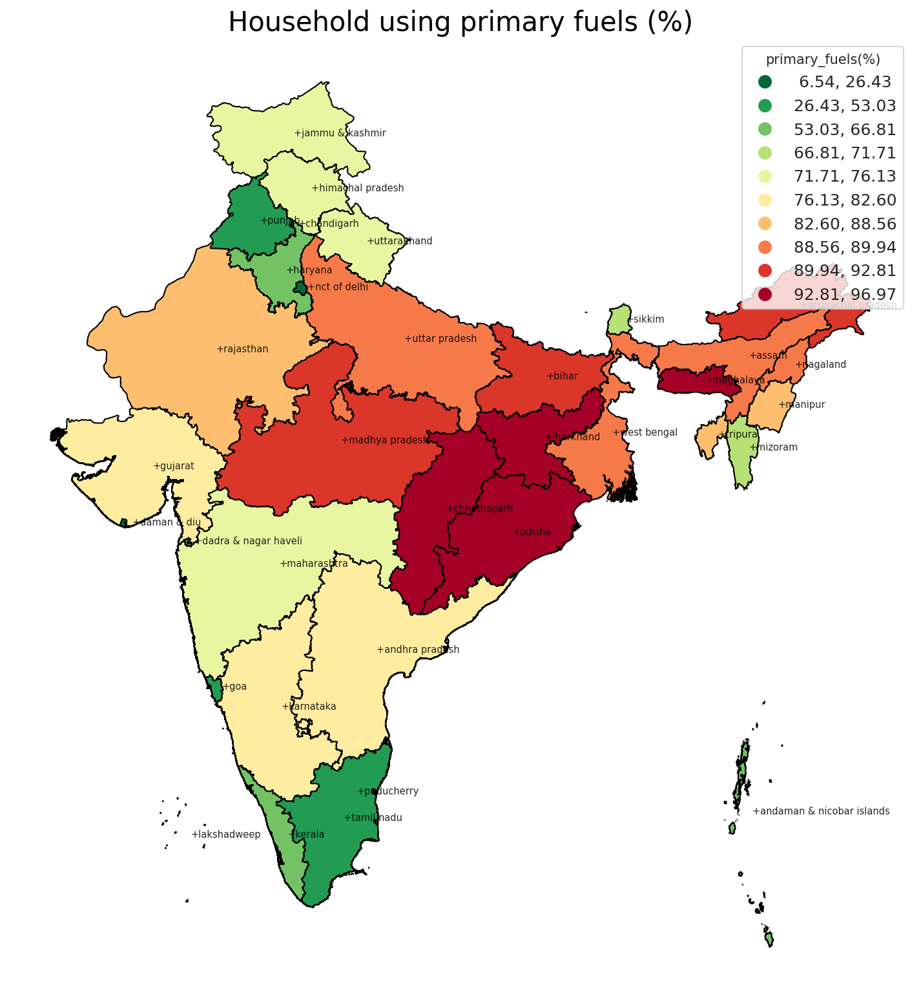

In [101]:

primary_fuels = gpd.GeoDataFrame(state_dataset[pf].sum(axis=1),
                                            columns = ['primary_fuels'],
                                            geometry = state_dataset['geometry']
                                            )

ax=primary_fuels.plot(column = 'primary_fuels',
                         legend=True,
                         cmap ='RdYlGn_r',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"primary_fuels(%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Household using primary fuels (%)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('primary_fuels.png')
plt.show()

# Transportation

<h3 style= 'color:green'> Which states have % of personal mechanical vehicles for transport? </h3>


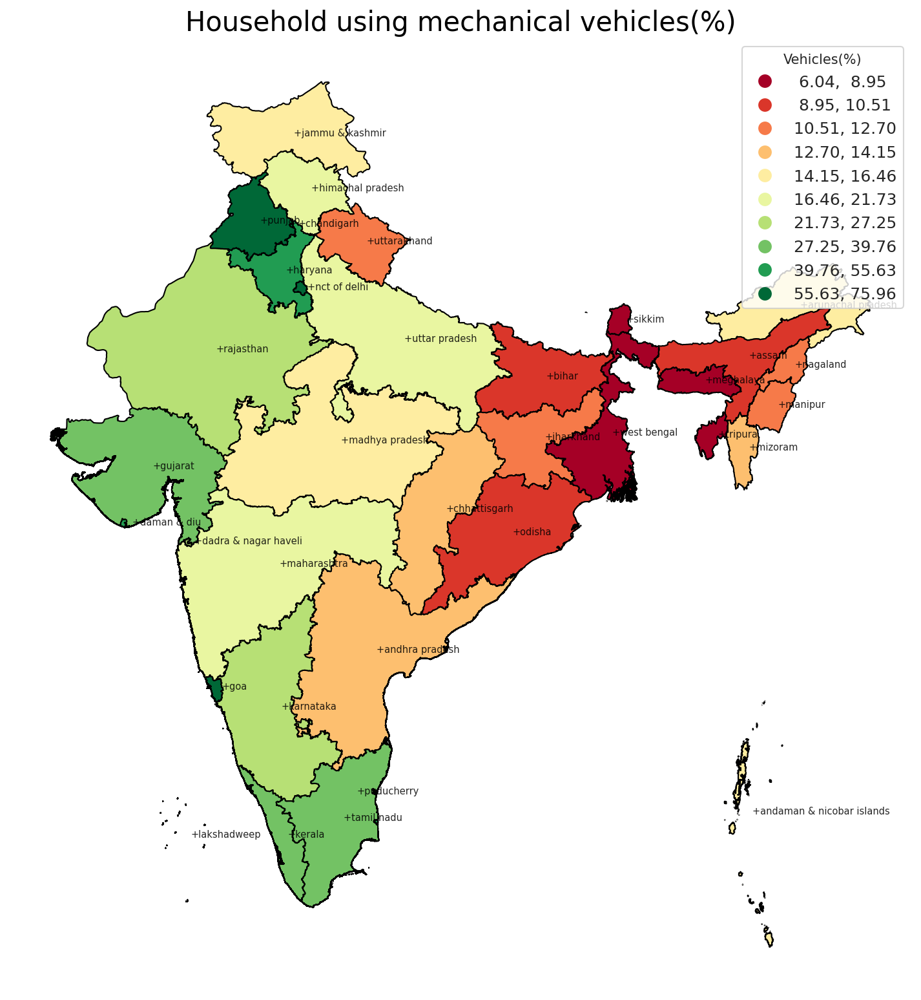

In [102]:

mec_trans = gpd.GeoDataFrame(state_dataset[['Availability of assets: Scooter/Motorcycle/Moped','Availability of assets: Car/Jeep/Van']].sum(axis=1),
                                            columns = ['mec_trans'],
                                            geometry = state_dataset['geometry']
                                            )

ax=mec_trans.plot(column = 'mec_trans',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Vehicles(%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Household using mechanical vehicles(%)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('mec_trans.png')
plt.show()

<h3 style= 'color:green'> Distribution of bicycles ownership? </h3>


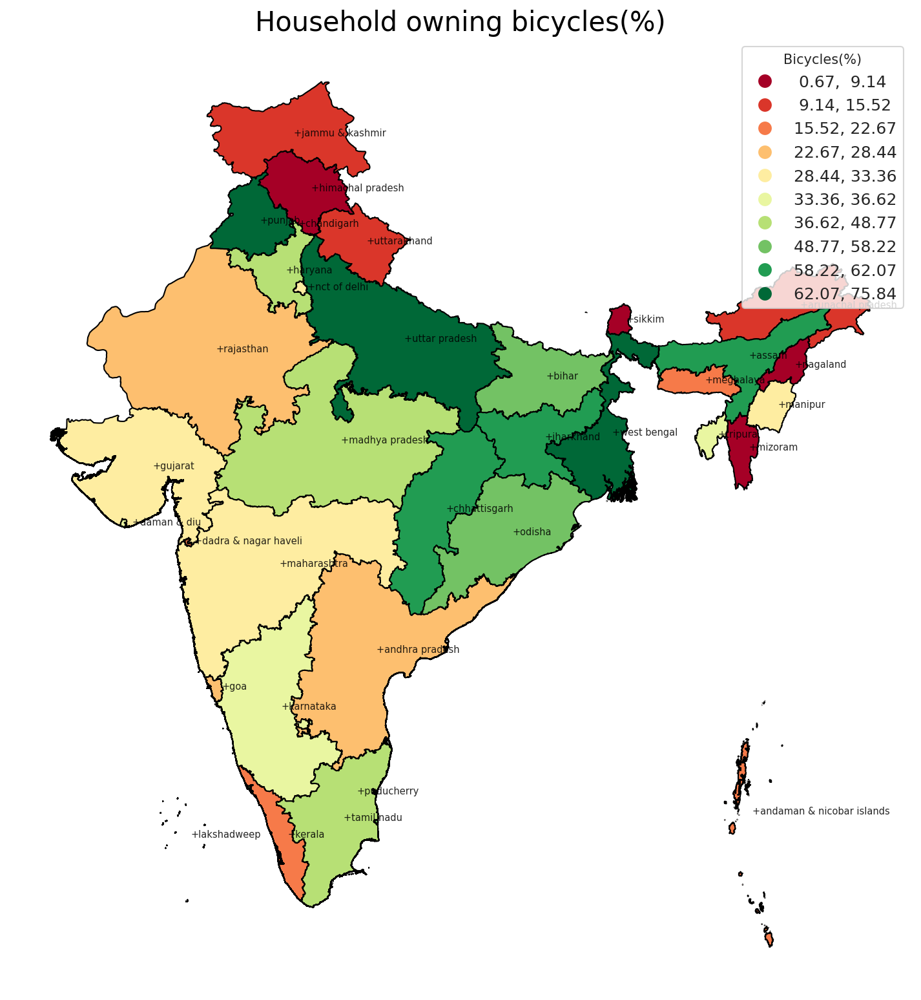

In [103]:

ax=state_dataset.plot(column = 'Availability of assets: Bicycle',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Bicycles(%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Household owning bicycles(%)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('bicycles.png')
plt.show()

# Use of electrical Items

<h3 style= 'color:green'> Which states have highest/lowest electrical items?? </h3>

In [104]:
electrical_items = ['Radio/Transistor','Television','Telephone/Mobile Phone','Computer/Laptop']

electrical_items_cols = state_dataset.columns[state_dataset.columns.str.contains('|'.join(electrical_items))]

#taking a mean 
electrical_items = gpd.GeoDataFrame({'elec':state_dataset[electrical_items_cols].mean(axis=1),
                                 'geometry':state_dataset['geometry']})

#these cols are included
electrical_items_cols

Index(['Availability of assets: Radio/Transistor',
       'Availability of assets: Television',
       'Availability of assets: Computer/Laptop (With Internet)',
       'Availability of assets: Computer/Laptop (Without Internet)',
       'Availability of assets: Telephone/Mobile Phone (Landline only)',
       'Availability of assets: Telephone/Mobile Phone (Mobile only)',
       'Availability of assets: Telephone/Mobile Phone (Both)'],
      dtype='object')

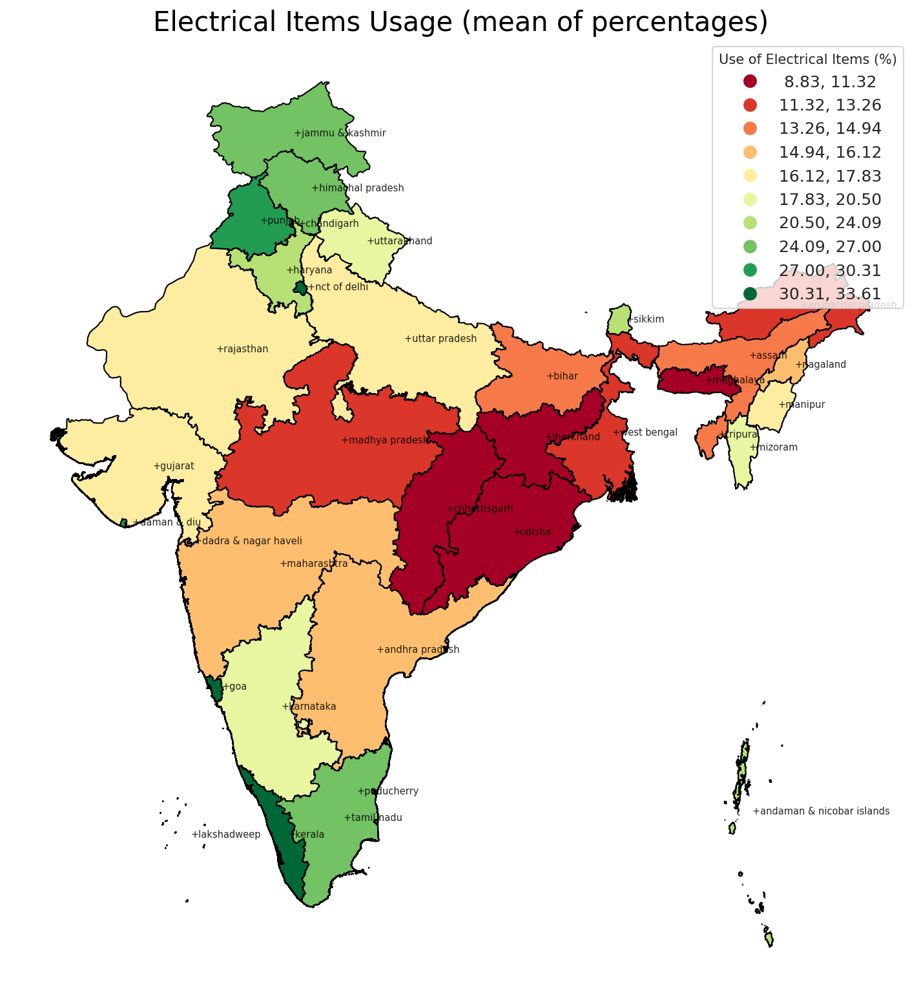

In [105]:
# norm = mpl.colors.BoundaryNorm(boundaries=[10,15,20,25,30,35,40],ncolors=7)
ax=electrical_items.plot(column = 'elec',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Use of Electrical Items (%)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Electrical Items Usage (mean of percentages)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('Elect_items_usage.png')
plt.show()

<h3 style= 'color:green'> How is the distribution of availablity/use of mobile phones/telephones ?? </h3>

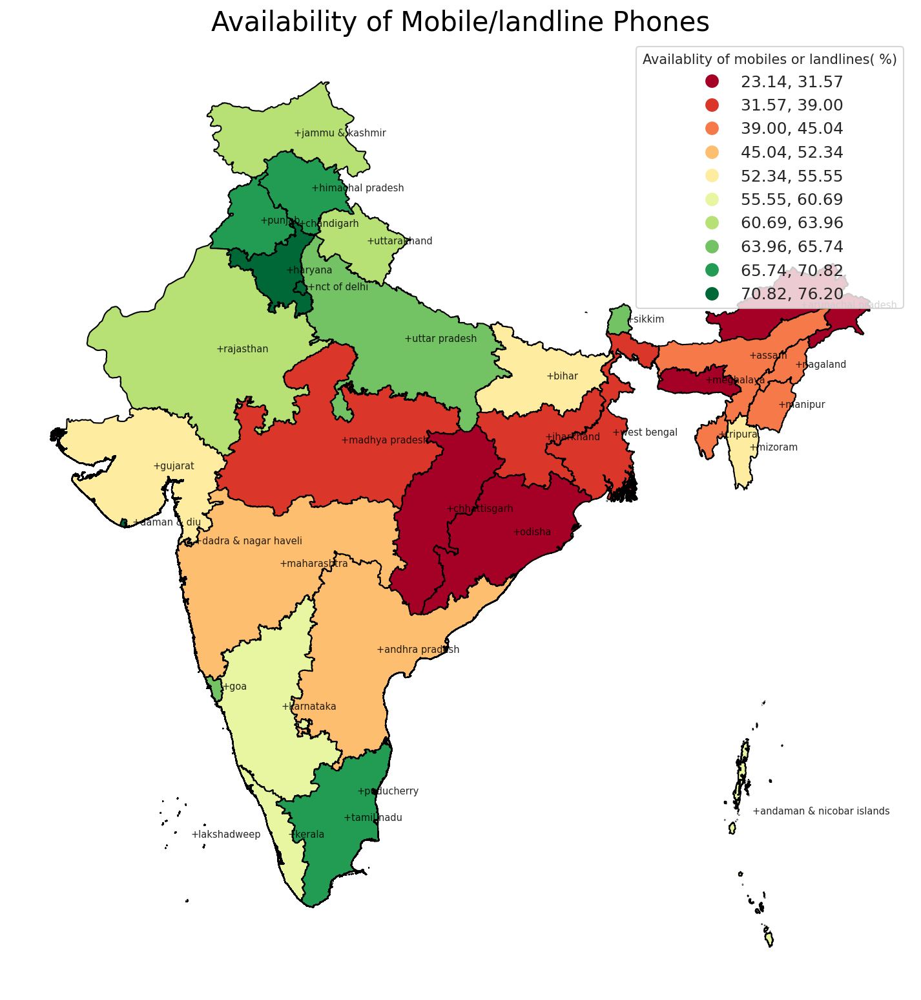

In [106]:
tel_mob = gpd.GeoDataFrame(state_dataset[['Availability of assets: Telephone/Mobile Phone (Mobile only)',
                                          'Availability of assets: Telephone/Mobile Phone (Landline only)']].sum(axis=1),
                                            columns = ['mob/landl'],
                                            geometry = state_dataset['geometry']
                                            )


ax=tel_mob.plot(column = 'mob/landl',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Availablity of mobiles or landlines( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Availability of Mobile/landline Phones',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('mobile.png')
plt.show()

<h3 style= 'color:green'> How is the distribution of availablity/use Televison sets?? </h3>

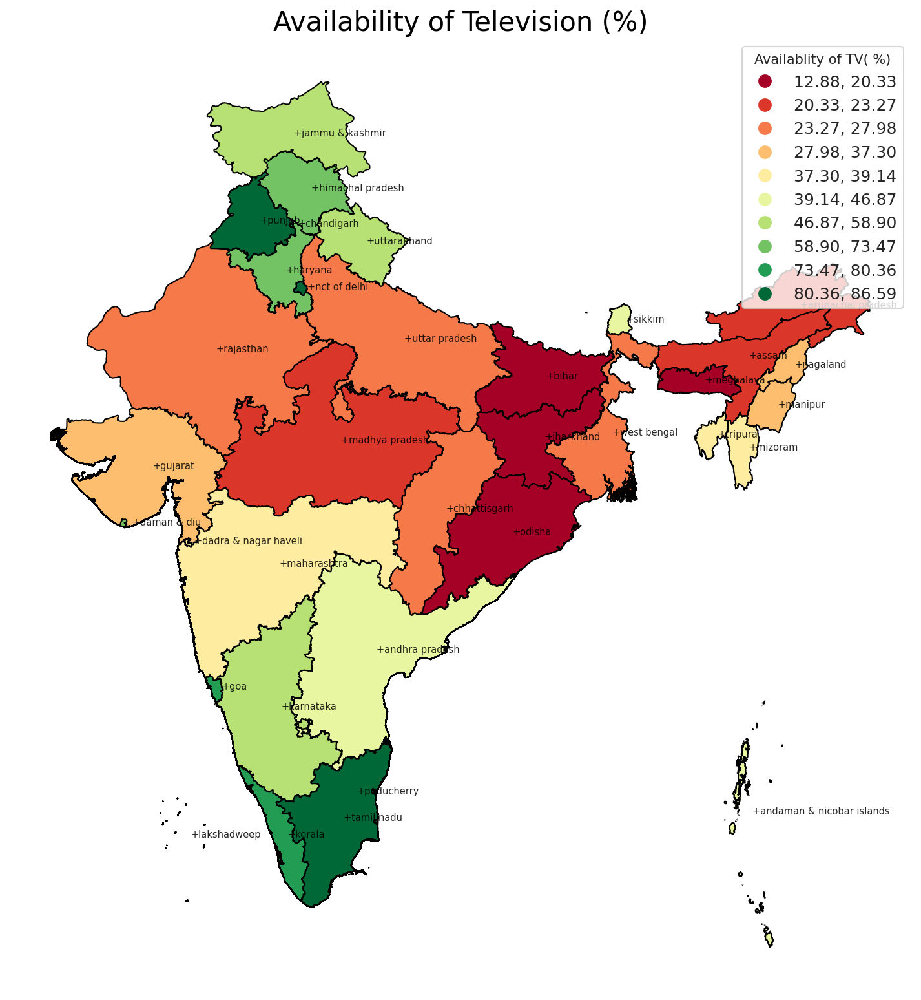

In [107]:

ax=state_dataset.plot(column = 'Availability of assets: Television',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Availablity of TV( %)",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Availability of Television (%)',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('tv.png')
plt.show()

# Maps of some Basic Indices.

<h2 style= 'color:green'> Lets make maps of some indices to help compress this information. These Indices are calculated by taking the first Principle component after the PCA transformation of the corresponding columns(Standardized) contributing to that index. </h2>

In [108]:
pca_pipeline = Pipeline(steps = [('standard_scaler',StandardScaler()),
                                 ('pca',PCA(n_components=1))
                                 ]
                       )


def calculate_index(
               columns_index,
               df = state_dataset,
               print_lambda=True):
    '''calculate indexes, by sum after multiplying the pc1 with features in that index. '''
    
    col_df = df.loc[:,columns_index]
#     col_df_std = StandardScaler().fit_transform(col_df)
    
    pca = pca_pipeline.fit_transform(col_df)
    
    
    if print_lambda :
        eig_vec = pca_pipeline['pca'].components_
        
        print('index = ' + ' + \n'.join(['*'.join([str(round(val,3)) , column]) for val,column in zip(list(eig_vec.ravel()),col_df.columns.tolist())]) )
        
    index_value = pca[:,0]
    assert len(index_value) == len(col_df), 'Why do you make life hard for everyone'
    
    
    return index_value

**Indices and the corresponding contributing columns**

In [109]:
bai_cols=['Location of drinking water source: Within premises',
 'Main Source of lighting: Electricity',
 'Number of households having latrine facility within the premises',
 'Number of households having bathing facility within the premises: Yes (Bathroom)',
 'Waste water outlet connected to: Closed drainage',
 'Kitchen facility: Cooking inside house:',
 'Type of Fuel used for Cooking: LPG/PNG',
 'Total number of households availing banking services'] #basic amenities columns

ai_cols=['Availability of assets: Radio/Transistor',
 'Availability of assets: Television',
 'Availability of assets: Computer/Laptop (With Internet)',
 'Availability of assets: Computer/Laptop (Without Internet)',
 'Availability of assets: Telephone/Mobile Phone (Landline only)',
 'Availability of assets: Telephone/Mobile Phone (Mobile only)',
 'Availability of assets: Telephone/Mobile Phone (Both)',
 'Availability of assets: Bicycle',
 'Availability of assets: Scooter/Motorcycle/Moped',
 'Availability of assets: Car/Jeep/Van']  # Indices of assets columns

qhi_cols=['Number of households with condition of Census House as: Residence (Good)',
 'Ownership status: Owned',
 'Number of Dwelling Rooms: Two rooms',
 'Number of Dwelling Rooms: Three rooms',
 'Number of Dwelling Rooms: Four rooms',
 'Number of Dwelling Rooms: Five rooms',
 'Number of Dwelling Rooms: Six rooms and above',
 'Households by Type of Structure of Census Houses: Permanent']  # quality of housing index columns

hqli_cols=bai_cols+ai_cols+qhi_cols # Combine all three categories of 

<h3 style= 'color:green'> Basic Aminities Index. </h3>

index = 0.397*Location of drinking water source: Within premises + 
0.37*Main Source of lighting: Electricity + 
0.326*Number of households having latrine facility within the premises + 
0.425*Number of households having bathing facility within the premises: Yes (Bathroom) + 
0.377*Waste water outlet connected to: Closed drainage + 
0.102*Kitchen facility: Cooking inside house: + 
0.408*Type of Fuel used for Cooking: LPG/PNG + 
0.316*Total number of households availing banking services


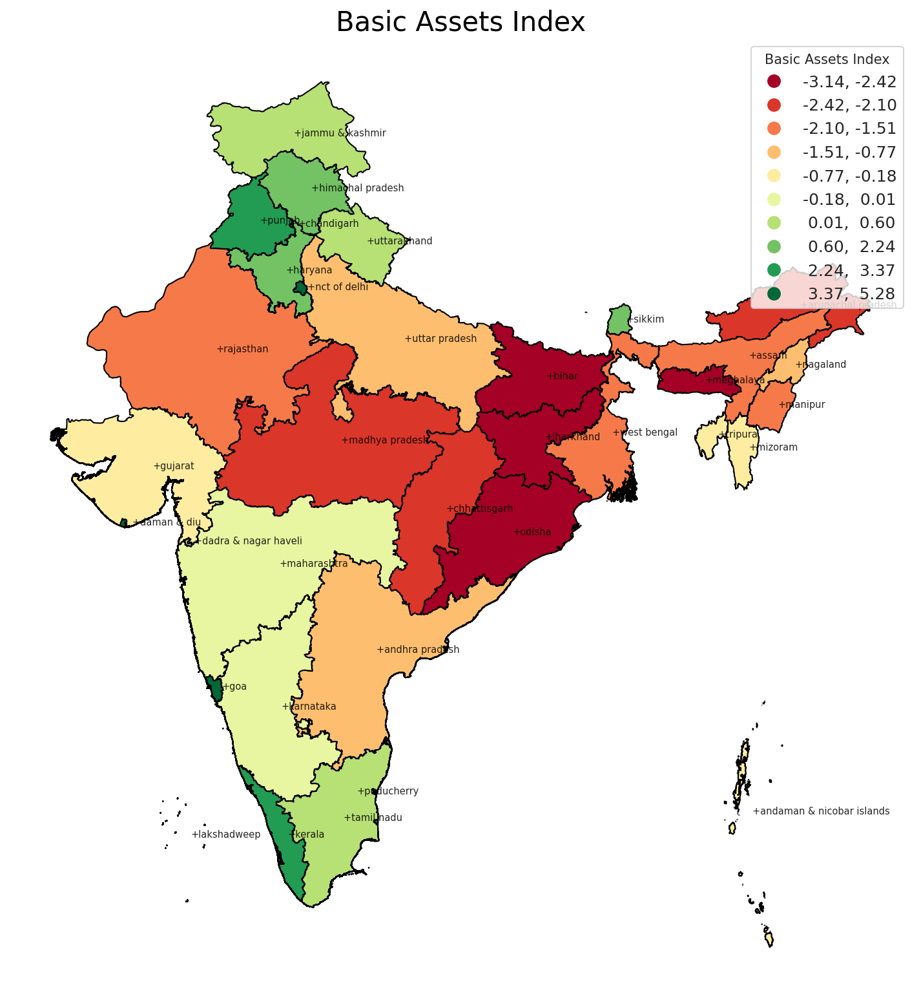

In [123]:
bai = calculate_index(columns_index=bai_cols)

state_dataset['bai'] = bai 


ax=state_dataset.plot(column = 'bai',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',
                         edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Basic Assets Index",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Basic Assets Index',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('bai.png')
plt.show()


<h3 style= 'color:green'> Assets Index </h3>

index = 0.143*Availability of assets: Radio/Transistor + 
0.372*Availability of assets: Television + 
0.369*Availability of assets: Computer/Laptop (With Internet) + 
0.362*Availability of assets: Computer/Laptop (Without Internet) + 
0.348*Availability of assets: Telephone/Mobile Phone (Landline only) + 
0.262*Availability of assets: Telephone/Mobile Phone (Mobile only) + 
0.338*Availability of assets: Telephone/Mobile Phone (Both) + 
0.03*Availability of assets: Bicycle + 
0.36*Availability of assets: Scooter/Motorcycle/Moped + 
0.372*Availability of assets: Car/Jeep/Van


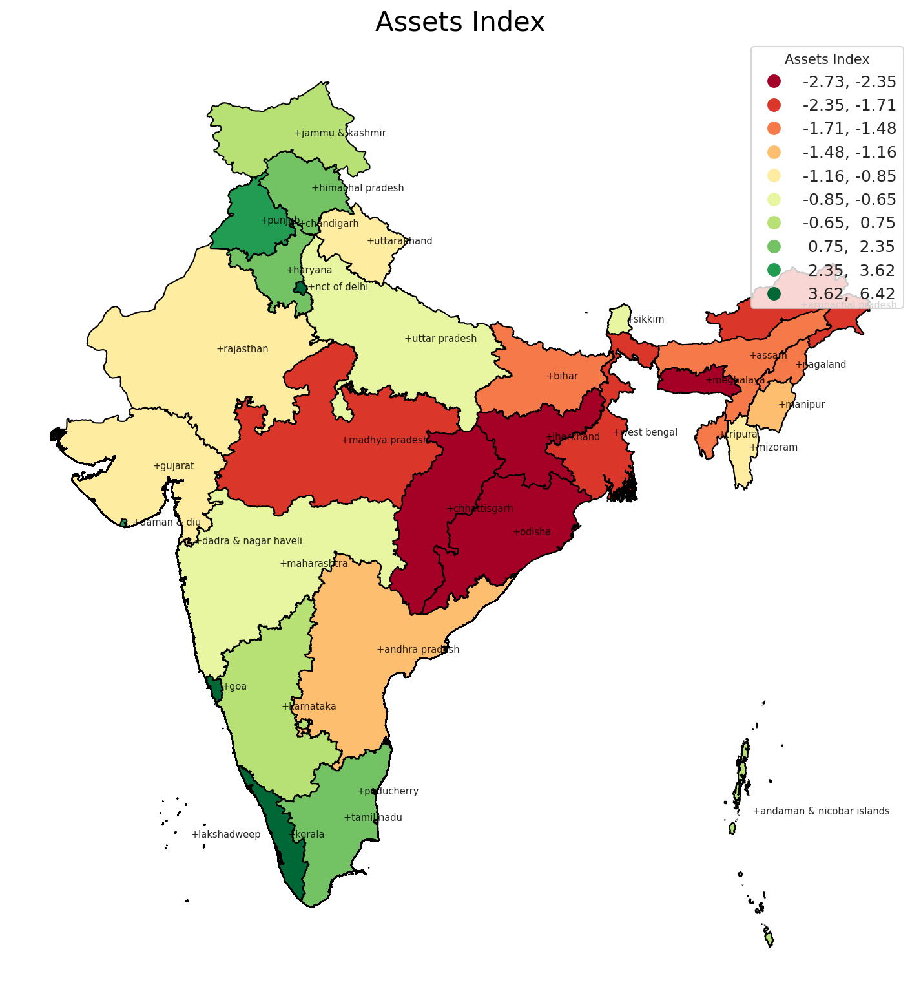

In [124]:
ai = calculate_index(columns_index=ai_cols)

state_dataset['ai'] = ai 


ax=state_dataset.plot(column = 'ai',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',
                         edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Assets Index",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Assets Index',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('ai.png')
plt.show()


<h3 style= 'color:green'> Quality of Housing Index </h3>

index = 0.294*Number of households with condition of Census House as: Residence (Good) + 
-0.09*Ownership status: Owned + 
-0.262*Number of Dwelling Rooms: Two rooms + 
0.319*Number of Dwelling Rooms: Three rooms + 
0.458*Number of Dwelling Rooms: Four rooms + 
0.463*Number of Dwelling Rooms: Five rooms + 
0.437*Number of Dwelling Rooms: Six rooms and above + 
0.346*Households by Type of Structure of Census Houses: Permanent


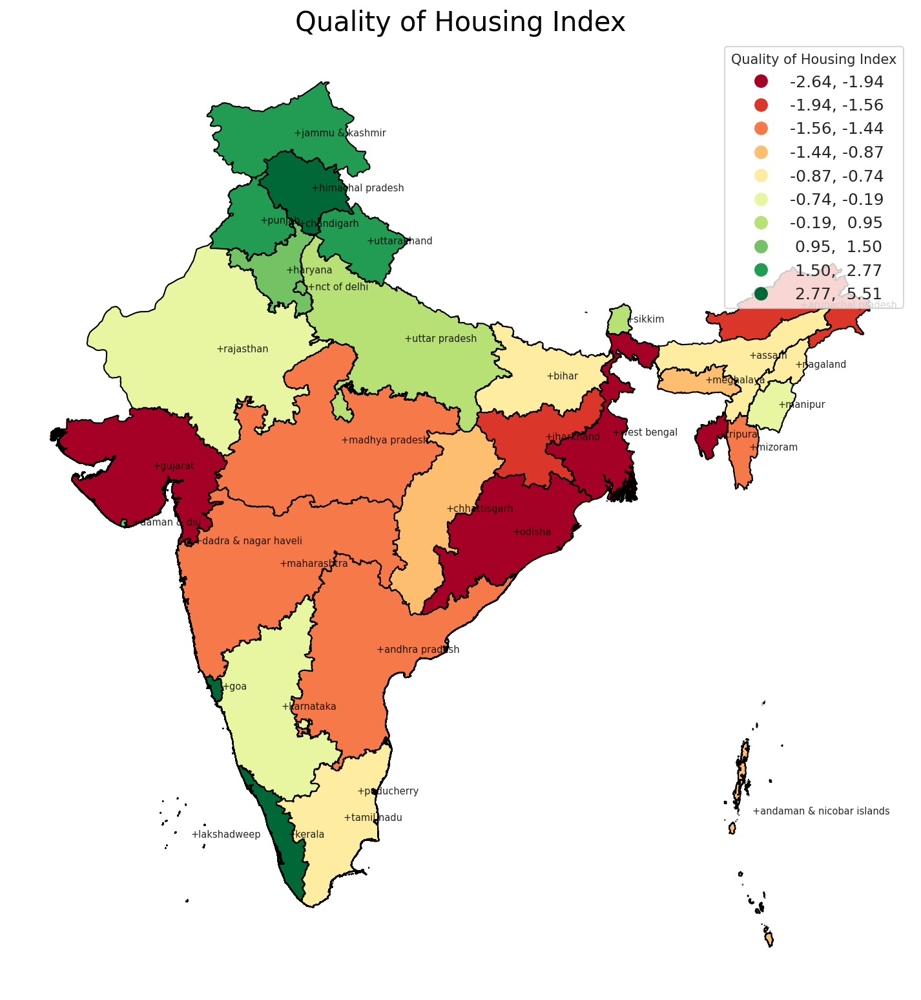

In [125]:
qhi = calculate_index(columns_index=qhi_cols)

state_dataset['qhi'] = qhi 


ax=state_dataset.plot(column = 'qhi',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',
                         edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Quality of Housing Index",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Quality of Housing Index',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('qhi.png')
plt.show()


<h3 style= 'color:green'> Household Quality  of Living Index </h3>

index = 0.243*Location of drinking water source: Within premises + 
0.211*Main Source of lighting: Electricity + 
0.196*Number of households having latrine facility within the premises + 
0.258*Number of households having bathing facility within the premises: Yes (Bathroom) + 
0.219*Waste water outlet connected to: Closed drainage + 
0.051*Kitchen facility: Cooking inside house: + 
0.236*Type of Fuel used for Cooking: LPG/PNG + 
0.196*Total number of households availing banking services + 
0.095*Availability of assets: Radio/Transistor + 
0.25*Availability of assets: Television + 
0.225*Availability of assets: Computer/Laptop (With Internet) + 
0.221*Availability of assets: Computer/Laptop (Without Internet) + 
0.225*Availability of assets: Telephone/Mobile Phone (Landline only) + 
0.187*Availability of assets: Telephone/Mobile Phone (Mobile only) + 
0.23*Availability of assets: Telephone/Mobile Phone (Both) + 
0.002*Availability of assets: Bicycle + 
0.222*Availability of assets: Scoo

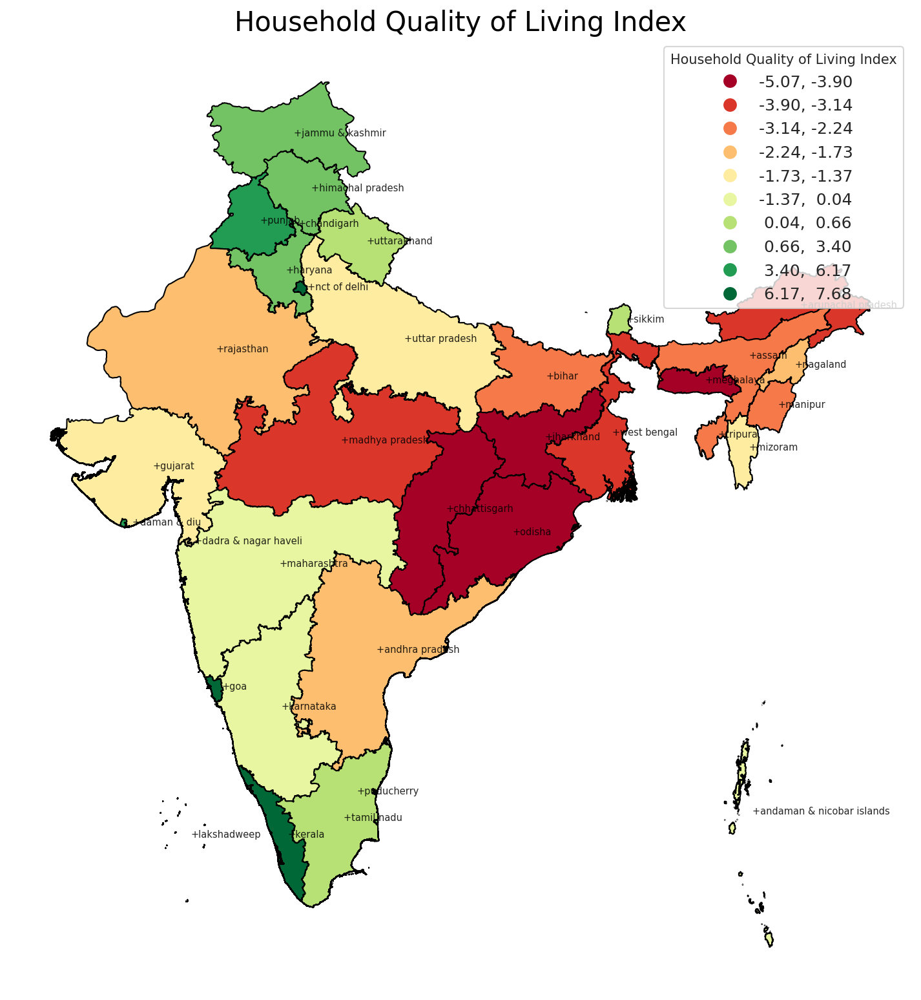

In [126]:
hqli = calculate_index(columns_index=hqli_cols)

state_dataset['hqli'] = hqli 


ax=state_dataset.plot(column = 'hqli',
                         legend=True,
                         cmap ='RdYlGn',
                         categorical=True,
                         scheme='QUANTILES',
                         edgecolor='k',
                         k=10,
                         legend_kwds = {'title':"Household Quality of Living Index",
                                        'loc':'upper right',
                                        'fontsize':'large','frameon':True}
                        )

ax.set_title('Household Quality of Living Index',
             size=20,
             color='k')

state_dataset.apply(lambda x: ax.annotate(text='+'+ x['State Name'],
                                          xy = (x['geometry'].centroid.x,x['geometry'].centroid.y),
                                          xytext=(5,-1),
                                          textcoords ='offset points',size=7,color='k',alpha=0.85),
                    axis=1)


plt.axis('off')

plt.savefig('hqli.png')
plt.show()


# End

In [121]:
!ls | wc -l 

27
